<a href="https://colab.research.google.com/github/Tapish0305/Medical_Imaging/blob/main/medical_imaging_finaley.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import torch
import shutil ## copying , deleting file
import os
import matplotlib.colors as mcolors
import seaborn as sns
import yaml
import cv2
import matplotlib
import matplotlib.pyplot as plt
import kagglehub

from tqdm.notebook import tqdm
from glob import glob ## used to search files which start with some specific pattern
from PIL import Image
from collections import Counter
from os import listdir
from os.path import isfile, join
from IPython.display import Image, clear_output
from sklearn.model_selection import GroupKFold
import kagglehub
import warnings
warnings.filterwarnings("ignore", category=UserWarning)


In [ ]:
!pip install -U albumentations

In [ ]:
%matplotlib inline

In [ ]:
yolov5_official_v31_dataset_path = kagglehub.dataset_download('awsaf49/yolov5-official-v31-dataset')

In [ ]:
import albumentations as A

DATA LOADING

In [ ]:
path = kagglehub.dataset_download("awsaf49/vinbigdata-512-image-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/vinbigdata-512-image-dataset


In [ ]:
vinbigdata_yolo_labels_dataset_path = kagglehub.dataset_download('awsaf49/vinbigdata-yolo-labels-dataset')

In [ ]:
dim = 512

DATA DESCRIPTION

In [ ]:
train_df = pd.read_csv('/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/train.csv')

In [ ]:
train_df.shape

(67914, 10)

In [ ]:
index = train_df[train_df["class_name"] == 'No finding'].index

In [ ]:
train_df = train_df.drop(index)
train_df = train_df.reset_index(drop=True)

In [ ]:
train_df.shape

(36096, 10)

In [ ]:
train_df['file_path'] = f'/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/train/'+train_df.image_id+('.png' if dim!='original' else '.jpg')
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,file_path
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,2080,2336,/kaggle/input/vinbigdata-512-image-dataset/vin...
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,2304,2880,/kaggle/input/vinbigdata-512-image-dataset/vin...
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0,2540,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,2285,2555,/kaggle/input/vinbigdata-512-image-dataset/vin...
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0,2568,3353,/kaggle/input/vinbigdata-512-image-dataset/vin...


In [ ]:
(train_df.class_id == 'NaN').sum()

0

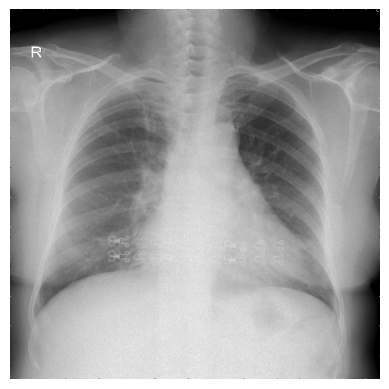

In [ ]:
image_path = '/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/train/9a5094b2563a1ef3ff50dc5c7ff71345.png'
image = plt.imread(image_path)
plt.imshow(image_rgb)
plt.axis("off")
plt.show()


In [ ]:
train_df.columns

Index(['image_id', 'class_name', 'class_id', 'rad_id', 'x_min', 'y_min',
       'x_max', 'y_max', 'width', 'height', 'file_path'],
      dtype='object')

In [ ]:
image.shape

(512, 512, 3)

In [ ]:
train_new = pd.DataFrame()
train_new = train_df.copy()

In [ ]:
train_df['x_max'] = train_df.apply(lambda row: (row.x_max)/row.width, axis =1)
train_df['x_min'] = train_df.apply(lambda row: (row.x_min)/row.width, axis =1)

train_df['y_max'] = train_df.apply(lambda row: (row.y_max)/row.height, axis =1)
train_df['y_min'] = train_df.apply(lambda row: (row.y_min)/row.height, axis =1)

train_df['x_mid'] = train_df.apply(lambda row: (row.x_max + row.x_min)/2 , axis=1)
train_df['y_mid'] = train_df.apply(lambda row: (row.y_max + row.y_min)/2 , axis=1)

In [ ]:
train_df.head()

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,width,height,file_path,x_mid,y_mid
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,0.332212,0.588613,0.794712,0.783818,2080,2336,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.563462,0.686216
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,0.548611,0.257986,0.699219,0.353819,2304,2880,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.623915,0.305903
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,0.246850,0.116211,0.372835,0.140951,2540,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.309843,0.128581
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,0.589497,0.095890,0.957549,0.848924,2285,2555,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.773523,0.472407
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,0.216900,0.701461,0.262850,0.740829,2568,3353,/kaggle/input/vinbigdata-512-image-dataset/vin...,0.239875,0.721145


In [ ]:
(train_df.class_id == '14').sum()

0

Exploratory Data Analysis

In [ ]:
class_name = train_df[['class_name']].value_counts()
list_label = class_name
list_label

class_name        
Aortic enlargement    7162
Cardiomegaly          5427
Pleural thickening    4842
Pulmonary fibrosis    4655
Nodule/Mass           2580
Lung Opacity          2483
Pleural effusion      2476
Other lesion          2203
Infiltration          1247
ILD                   1000
Calcification          960
Consolidation          556
Atelectasis            279
Pneumothorax           226
Name: count, dtype: int64

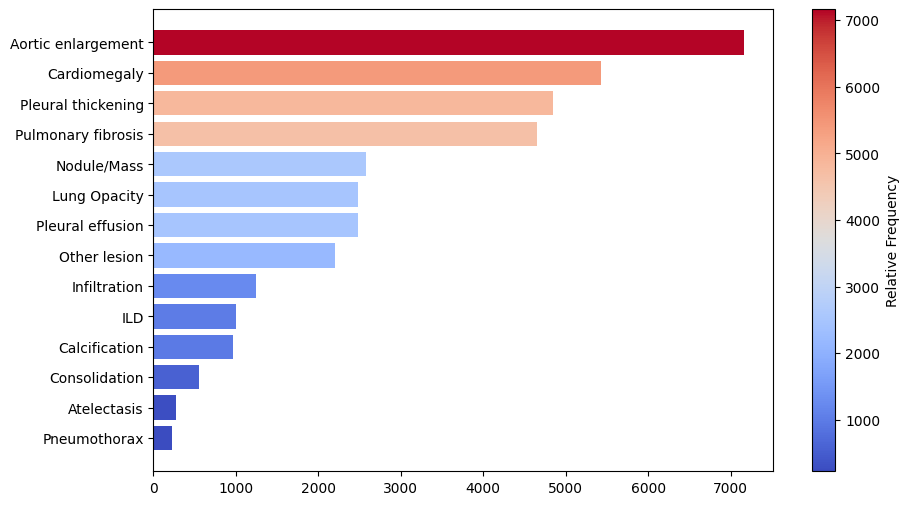

In [ ]:
series = pd.Series({
    "Aortic enlargement": 7162,
    "Cardiomegaly": 5427,
    "Pleural thickening": 4842,
    "Pulmonary fibrosis": 4655,
    "Nodule/Mass": 2580,
    "Lung Opacity": 2483,
    "Pleural effusion": 2476,
    "Other lesion": 2203,
    "Infiltration": 1247,
    "ILD": 1000,
    "Calcification": 960,
    "Consolidation": 556,
    "Atelectasis": 279,
    "Pneumothorax": 226,
})

df = series.reset_index()
df.columns = ['class_name', 'count']
list_class_name = df['class_name'].tolist()
list_count = df['count'].tolist()

# Normalize for color mapping
normalize = (df['count'] - min(df['count'])) / (max(df['count']) - min(df['count']))
cmap = plt.cm.coolwarm
colors = cmap(normalize)

# Create plot
fig, ax = plt.subplots(figsize=(10,6))
bars = ax.barh(list_class_name, list_count, color=colors)
ax.invert_yaxis()  # Reverse y-axis for better visualization

# Create a ScalarMappable object for the colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=min(list_count), vmax=max(list_count)))
sm.set_array([])  # Necessary to avoid error


cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Relative Frequency')

plt.show()


Data Augumentation

In [ ]:
transform = A.Compose([
    A.HorizontalFlip(p=0.2),
    A.Rotate(limit = 90, p = 0.2),
    A.RandomBrightnessContrast(p = 0.2),
    A.GaussNoise(var_limit = (10,40), p = 0.2),
    A.GaussianBlur(blur_limit = (3, 7), p = 0.2)]
)

In [ ]:
list_class_name

['Aortic enlargement',
 'Cardiomegaly',
 'Pleural thickening',
 'Pulmonary fibrosis',
 'Nodule/Mass',
 'Lung Opacity',
 'Pleural effusion',
 'Other lesion',
 'Infiltration',
 'ILD',
 'Calcification',
 'Consolidation',
 'Atelectasis',
 'Pneumothorax']

# YOLO v5 ARCHITECT

In [ ]:
gkf = GroupKFold(n_splits = 5)
train_df['fold'] = -1
cou = 0
for fold, (train_idx, val_idx) in enumerate(gkf.split(train_df, groups = train_df.image_id.tolist())):
    train_df.loc[val_idx, 'fold'] = fold

In [ ]:
train_files = []
val_files = []
val_files+= list(train_df[train_df['fold']==fold].file_path.unique())
train_files+= list(train_df[train_df['fold']!=fold].file_path.unique())
train_files[0]

'/kaggle/input/vinbigdata-512-image-dataset/vinbigdata/train/9a5094b2563a1ef3ff50dc5c7ff71345.png'

In [ ]:
train_df['w'] = (train_df['x_min']+train_df['x_max'])/2
train_df['h'] = (train_df['y_min']+train_df['y_max'])/2
train_df = train_df[['class_id', 'x_mid', 'y_mid', 'w', 'h']]
train_df

,class_id,x_mid,y_mid,w,h
0,3,0.563462,0.686216,0.563462,0.686216
1,0,0.623915,0.305903,0.623915,0.305903
2,11,0.309843,0.128581,0.309843,0.128581
3,5,0.773523,0.472407,0.773523,0.472407
4,8,0.239875,0.721145,0.239875,0.721145
...,...,...,...,...,...
36091,10,0.174045,0.616493,0.174045,0.616493
36092,13,0.407064,0.281250,0.407064,0.281250
36093,5,0.266846,0.434400,0.266846,0.434400
36094,9,0.060330,0.417708,0.060330,0.417708


IMAGES

In [ ]:
os.makedirs('/kaggle/working/config/images/train/', exist_ok = True)
os.makedirs('/kaggle/working/config/images/val/', exist_ok = True)
os.makedirs('/kaggle/working/config/labels/train/', exist_ok = True)
os.makedirs('/kaggle/working/config/labels/val/', exist_ok = True)

In [ ]:
label_dir = '/kaggle/input/vinbigdata-yolo-labels-dataset/labels/'

for file in train_files:
    shutil.copy(file,'/kaggle/working/config/images/train/')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir, filename + '.txt'), '/kaggle/working/config/labels/train/')

for file in val_files:
    shutil.copy(file, '/kaggle/working/config/images/val/')
    filename = file.split('/')[-1].split('.')[0]
    shutil.copy(os.path.join(label_dir,filename+'.txt'), '/kaggle/working/config/labels/val/')

In [ ]:
cwd = '/kaggle/working/'

with open(join(cwd, 'train.txt'),'w') as f:
    for file in glob('/kaggle/working/config/images/train/*'):
        f.write(file+'\n')

with open(join(cwd, 'val.txt'),'w') as f:
    for file in glob('/kaggle/working/config/images/val/*'):
        f.write(file+'\n')

In [ ]:
data = dict(
    train =  join(cwd, 'train.txt'),
    val   =  join(cwd, 'val.txt'),
    nc    = 14,
    names = list_class_name
    )

with open(join('/kaggle/working/', 'config.yaml'), 'w') as outfile:
    yaml.dump(data, outfile, default_flow_style=False)

f = open(join('/kaggle/working/' , 'config.yaml'), 'r')
print('\nyaml:')
print(f.read())


yaml:
names:
- Aortic enlargement
- Cardiomegaly
- Pleural thickening
- Pulmonary fibrosis
- Nodule/Mass
- Lung Opacity
- Pleural effusion
- Other lesion
- Infiltration
- ILD
- Calcification
- Consolidation
- Atelectasis
- Pneumothorax
nc: 14
train: /kaggle/working/train.txt
val: /kaggle/working/val.txt



In [ ]:
# # Clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5.git
%cd yolov5

# # Install dependencies
!pip install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 17322, done.
remote: Counting objects: 100% (52/52), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 17322 (delta 25), reused 13 (delta 7), pack-reused 17270 (from 3)
Receiving objects: 100% (17322/17322), 16.17 MiB | 32.59 MiB/s, done.
Resolving deltas: 100% (11883/11883), done.
/kaggle/working/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 40.0 MB/s eta 0:00:00


In [ ]:

import torch
from IPython.display import Image, clear_output  # to display images

clear_output()

In [ ]:
 %pip install -qr requirements.txt # install dependencies

Note: you may need to restart the kernel to use updated packages.


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
detect: weights=['yolov5s.pt'], source=data/images/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-399-g8cc44963 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)

100%|███████████████████████████████████████| 14.1M/14.1M [00:00<00:00, 121MB/s]

Fusing layers... 
YOLOv5s summary: 213

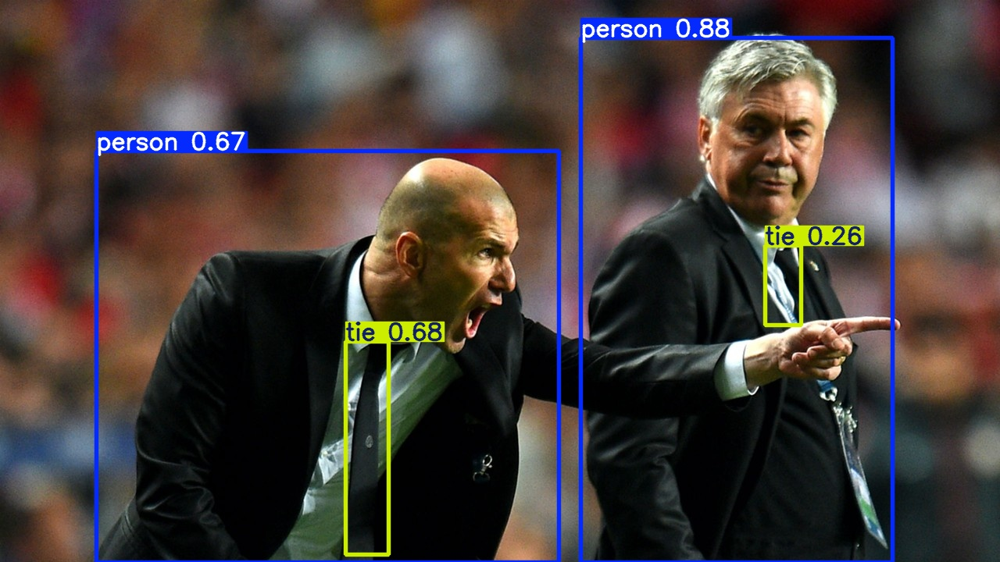

In [ ]:
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/
Image(filename='runs/detect/exp/zidane.jpg', width=600)

In [ ]:
!WANDB_MODE="dryrun" python train.py --img 640 --batch 16 --epochs 30 --data /kaggle/working/config.yaml --weights yolov5x.pt --cache

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2025-03-23 10:33:11.718828: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-23 10:33:11.913662: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-23 10:33:11.974348: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
train: weights=yolov5x.pt, cfg=, data=/kaggle/working/config.yaml, hyp=data/hyps/hyp.scratch-

In [ ]:
!ls -lh runs/train/exp

total 10M
-rw-r--r-- 1 root root 356K Mar 23 12:08 confusion_matrix.png
-rw-r--r-- 1 root root 2.7M Mar 23 12:08 events.out.tfevents.1742726002.8e8a1c2ba40c.119.0
-rw-r--r-- 1 root root 398K Mar 23 12:08 F1_curve.png
-rw-r--r-- 1 root root  373 Mar 23 10:33 hyp.yaml
-rw-r--r-- 1 root root 228K Mar 23 10:33 labels_correlogram.jpg
-rw-r--r-- 1 root root 167K Mar 23 10:33 labels.jpg
-rw-r--r-- 1 root root 1.1K Mar 23 10:33 opt.yaml
-rw-r--r-- 1 root root 460K Mar 23 12:08 P_curve.png
-rw-r--r-- 1 root root 449K Mar 23 12:08 PR_curve.png
-rw-r--r-- 1 root root 353K Mar 23 12:08 R_curve.png
-rw-r--r-- 1 root root 9.0K Mar 23 12:07 results.csv
-rw-r--r-- 1 root root 286K Mar 23 12:08 results.png
-rw-r--r-- 1 root root 454K Mar 23 10:33 train_batch0.jpg
-rw-r--r-- 1 root root 449K Mar 23 10:33 train_batch1.jpg
-rw-r--r-- 1 root root 432K Mar 23 10:34 train_batch2.jpg
-rw-r--r-- 1 root root 565K Mar 23 12:07 val_batch0_labels.jpg
-rw-r--r-- 1 root root 551K Mar 23 12:07 val_batch0_pred.jpg
-rw

In [ ]:
import shutil

# Trained model ko save karne ka path (default YOLOv5 path)
source_path = "runs/train/exp/weights/best.pt"  # Ensure this path exists
destination_path = "yolov5_best_model.pt"  # Jaha tum save karna chahte ho

# Model ko copy karke save karna
shutil.copy(source_path, destination_path)

print(f"Model saved at {destination_path}")


Model saved at yolov5_best_model.pt


In [ ]:
source_path = 'runs/train/exp'
destination_path = 'full_dir'
shutil.copytree(source_path, destination_path)
print(f"full directory saved at destination path : {destination_path}")

full directory saved at destination path : full_dir


F1 curve

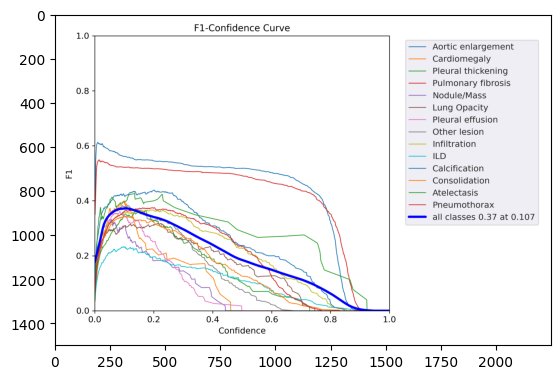

In [ ]:
plt.imshow(plt.imread('/kaggle/working/yolov5/full_dir/F1_curve.png'))

Confusion Matrix

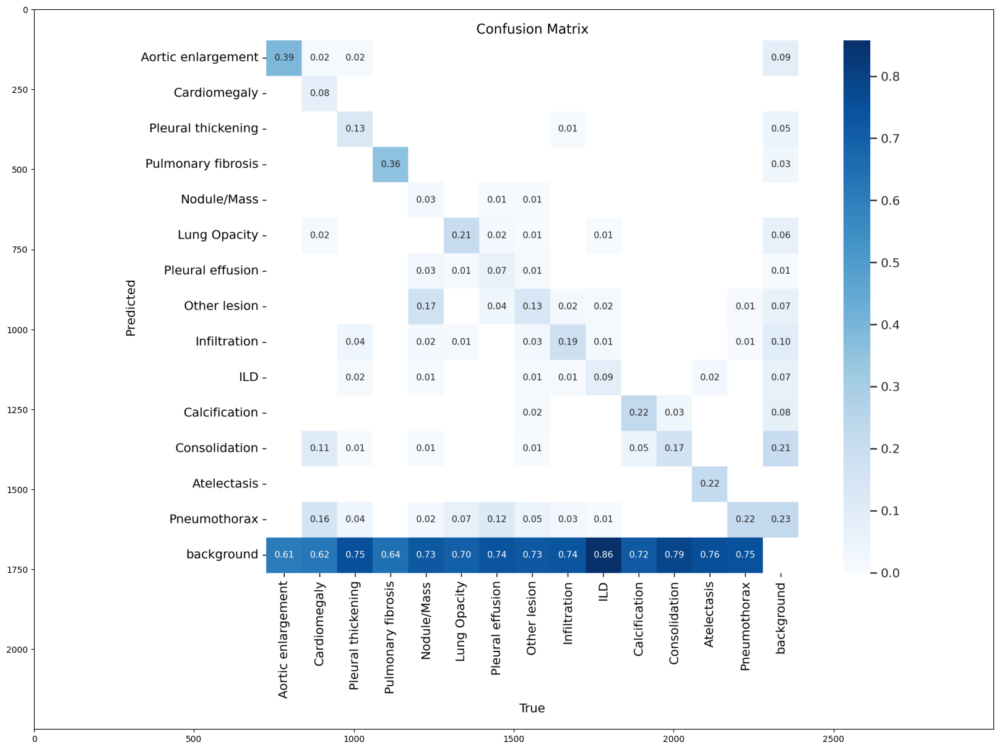

In [ ]:
plt.figure(figsize = (20,20))
plt.imshow(plt.imread('/kaggle/working/yolov5/full_dir/confusion_matrix.png'))

BATCH SIZE IMAGES

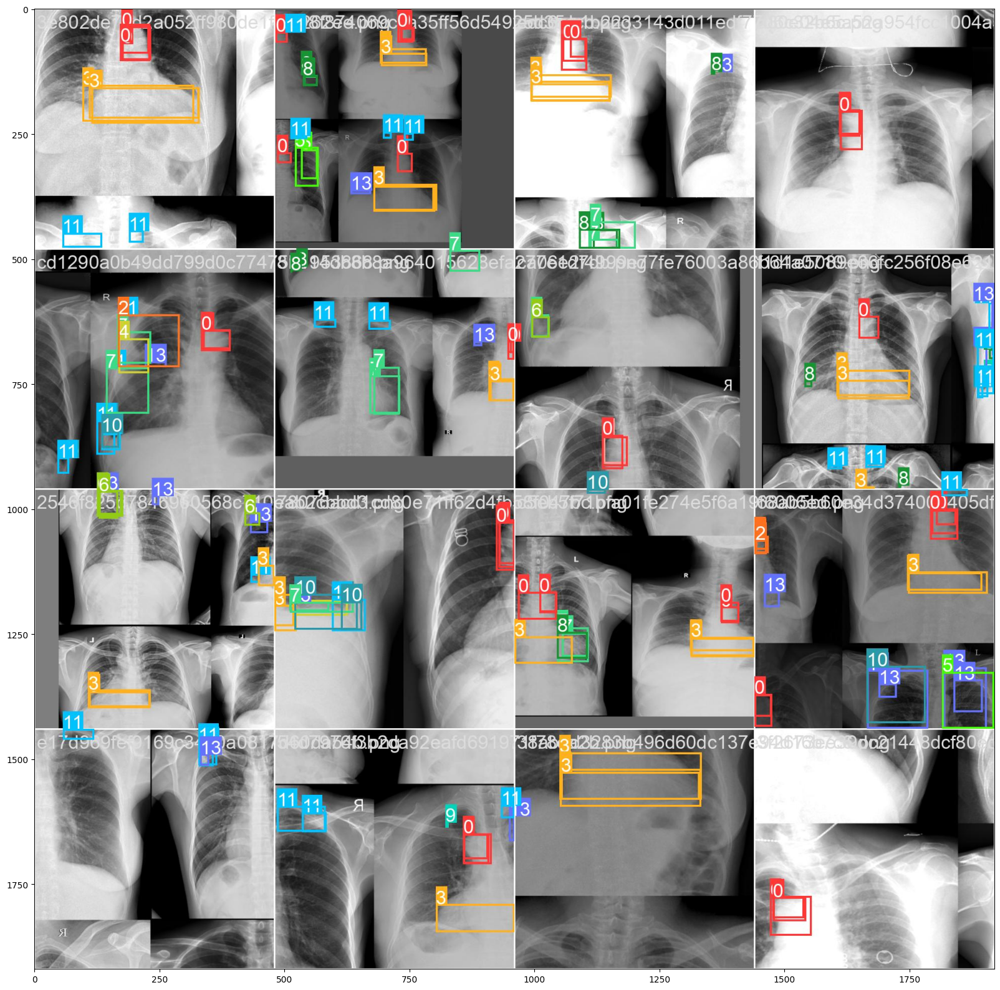

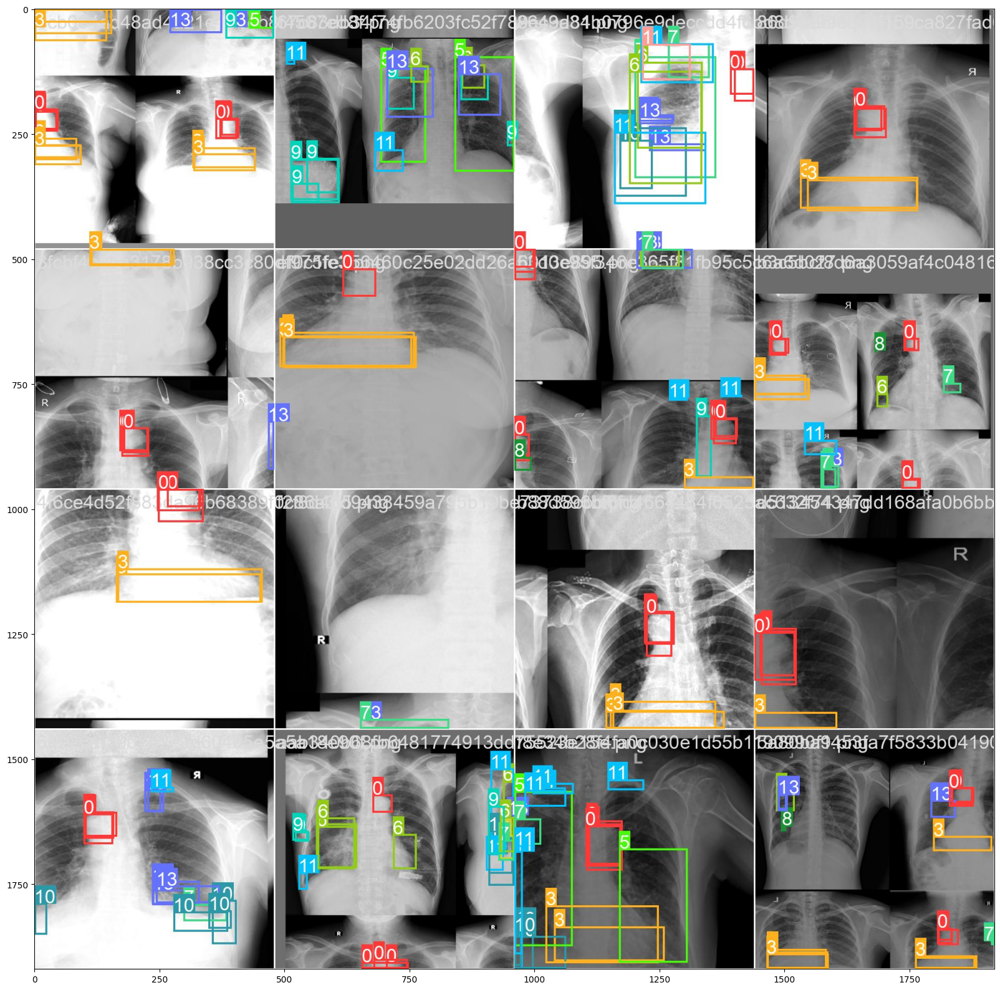

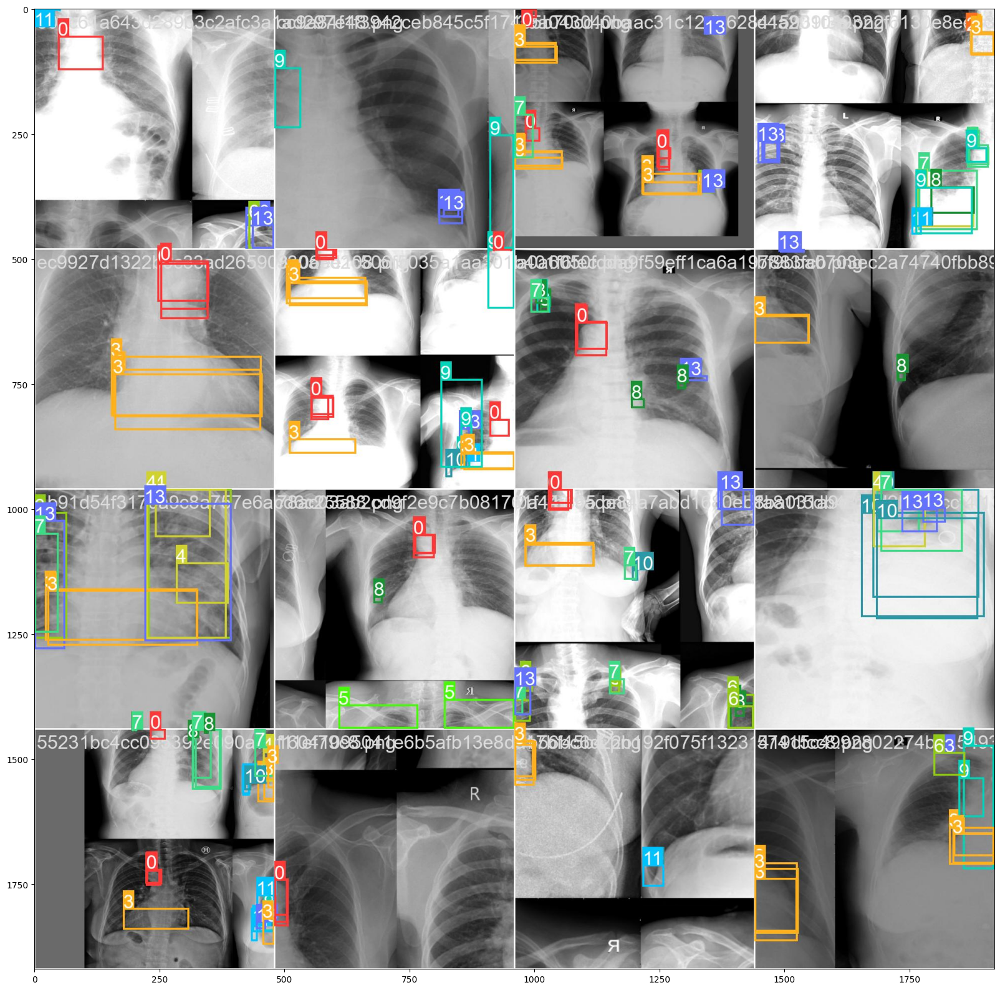

In [ ]:
plt.figure(figsize=(20,20))
plt.imshow(plt.imread('/kaggle/working/yolov5/full_dir/train_batch0.jpg'))
plt.figure(figsize=(20,20))
plt.imshow(plt.imread('/kaggle/working/yolov5/full_dir/train_batch1.jpg'))
plt.figure(figsize = (20,20))
plt.imshow(plt.imread('/kaggle/working/yolov5/full_dir/train_batch2.jpg'))

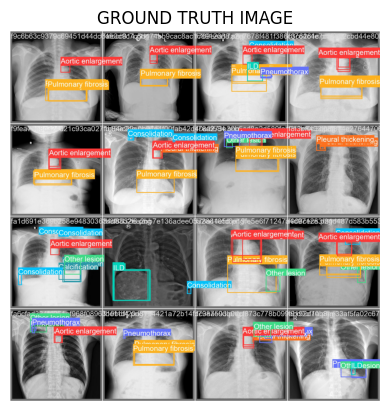

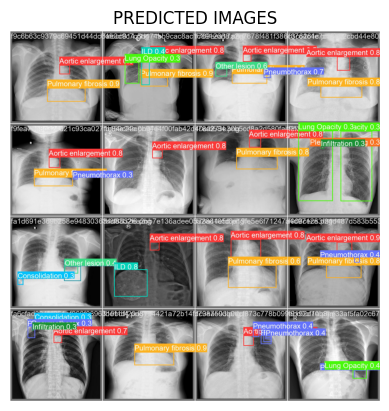

In [ ]:
## GROUND TRUTH VALUE
fig, ax = plt.subplots(1,1)
ax.imshow(plt.imread(f'/kaggle/working/yolov5/full_dir/val_batch0_labels.jpg'))
ax.set_title('GROUND TRUTH IMAGE')
ax.set_axis_off()
## PREDICTED VALUE
fig, ax = plt.subplots(1,1)
ax.imshow(plt.imread(f'/kaggle/working/yolov5/full_dir/val_batch0_pred.jpg'))
ax.set_title('PREDICTED IMAGES')
ax.set_axis_off()

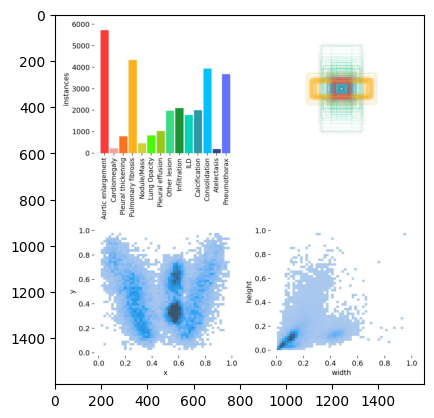

In [ ]:
##
plt.imshow(plt.imread('/kaggle/working/yolov5/full_dir/labels.jpg'))

Losses and mAP

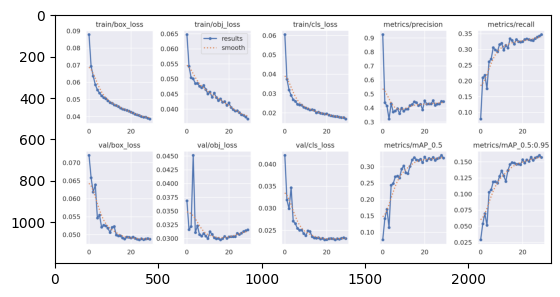

In [ ]:
## graphs of losses map and metrics vs epochs
plt.imshow(plt.imread('/kaggle/working/yolov5/full_dir/results.png'))

CORRELOGRAM

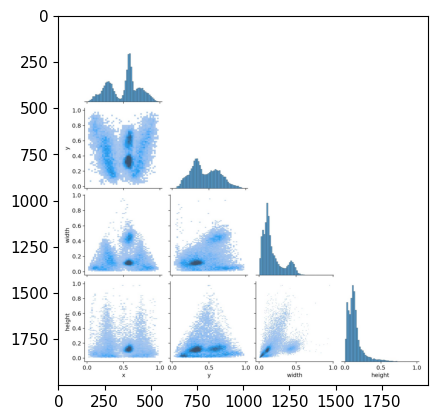

In [ ]:
plt.imshow(plt.imread('/kaggle/input/runs/pytorch/default/1/labels_correlogram.jpg'))

In [ ]:
!python detect.py --weights '/kaggle/working/yolov5/runs/train/exp/weights/best.pt'\
--img 640\
--conf 0.15\
--iou 0.5\
--source /kaggle/working/config/images/val\
--exist-ok

detect: weights=['/kaggle/working/yolov5/runs/train/exp/weights/best.pt'], source=/kaggle/working/config/images/val, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.15, iou_thres=0.5, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-399-g8cc44963 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 322 layers, 86260891 parameters, 0 gradients, 204.0 GFLOPs
image 1/879 /kaggle/working/config/images/val/000d68e42b71d3eac10ccc077aba07c1.png: 640x640 9 ILDs, 74.5ms
image 2/879 /kaggle/working/config/images/val/0061cf6d35e253b6e7f03940592cc35e.png: 640x640 1 Aortic enlargement, 1 ILD, 55.3ms
image 3/879 /kaggle/working/config/images/

In [ ]:
import torch

# YOLOv5 ka trained model load karna
model = torch.hub.load("ultralytics/yolov5", "custom", path="/kaggle/input/model/pytorch/default/1/yolov5_best_model (1).pt", force_reload=True)

model


Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


YOLOv5 🚀 2025-3-25 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 322 layers, 86260891 parameters, 0 gradients, 204.0 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 80, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(80, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(160, 80, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(160, 80, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(160, 160, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(80, 80, kernel_size=(1, 1), stride=(1, 1

In [ ]:
train_new.shape

(36096, 11)

In [ ]:
train_new.head()

,image_id,class_name,class_id,rad_id,x_min,...,x_max,y_max,width,height,file_path
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,...,1653.0,1831.0,2080,2336,/kaggle/input/vinbigdata-512-image-dataset/vin...
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,...,1611.0,1019.0,2304,2880,/kaggle/input/vinbigdata-512-image-dataset/vin...
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,...,947.0,433.0,2540,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,...,2188.0,2169.0,2285,2555,/kaggle/input/vinbigdata-512-image-dataset/vin...
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,...,675.0,2484.0,2568,3353,/kaggle/input/vinbigdata-512-image-dataset/vin...


In [ ]:
choice = np.random.choice(train_new.shape[0])

In [ ]:
image_id = train_new.iloc[choice].image_id
x_min = train_new.iloc[choice].x_min
x_max = train_new.iloc[choice].x_max
y_min = train_new.iloc[choice].y_min
y_max = train_new.iloc[choice].y_max
width = train_new.iloc[choice].width
height = train_new.iloc[choice].height
class_name =  train_new.iloc[choice].class_name

In [ ]:
train_path_image = '/kaggle/working/config/images/train/'+f'{image_id}'+'.png'
val_path_image = '/kaggle/working/config/images/val/'+f'{image_id}'+'.png'
path0 = '/kaggle/working/config/images/train/*'
path1 = '/kaggle/working/config/images/val/*'
if train_path_image in glob(path0):
    pathy = train_path_image
    term = 'train'
else:
    pathy = val_path_image
    term = 'val'

In [ ]:
label_path = '/kaggle/working/config/labels/'+f'{term}/'+f'{image_id}'+'.txt'
label_path

'/kaggle/working/config/labels/train/ab2fa61dbfb45bfa62491cd3240a37eb.txt'

In [ ]:
pathy

'/kaggle/working/config/images/train/ab2fa61dbfb45bfa62491cd3240a37eb.png'

In [ ]:
train_new.head()

,image_id,class_name,class_id,rad_id,x_min,...,x_max,y_max,width,height,file_path
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,...,1653.0,1831.0,2080,2336,/kaggle/input/vinbigdata-512-image-dataset/vin...
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,...,1611.0,1019.0,2304,2880,/kaggle/input/vinbigdata-512-image-dataset/vin...
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,...,947.0,433.0,2540,3072,/kaggle/input/vinbigdata-512-image-dataset/vin...
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,...,2188.0,2169.0,2285,2555,/kaggle/input/vinbigdata-512-image-dataset/vin...
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,...,675.0,2484.0,2568,3353,/kaggle/input/vinbigdata-512-image-dataset/vin...


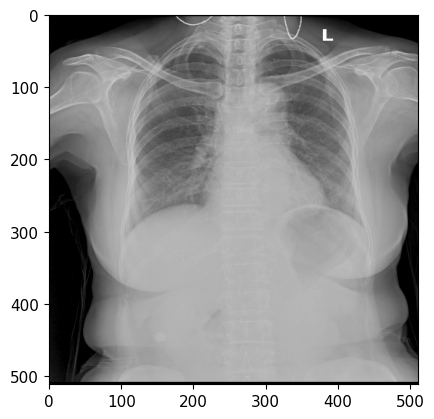

In [ ]:
plt.imshow(plt.imread(pathy),cmap = 'gray')

In [ ]:
print(image.dtype, image.min(), image.max())  # Ensure proper value range


uint8 0 255


In [ ]:
plt.imread(pathy).shape

(512, 512)

In [ ]:
image = plt.imread(pathy)

In [ ]:
image.shape[0]

512

In [ ]:
changes0 = image.shape[0]/width
changes1 = image.shape[1]/height
x_min_scaled = changes0*x_min
x_max_scaled = changes0*x_max
y_min_scaled = changes1*y_min
y_max_scaled = changes1*y_max

In [ ]:
bbox_width = x_max_scaled - x_min_scaled
bbox_height = y_max_scaled - y_min_scaled

In [ ]:
print(bbox_width, bbox_height, class_name)

49.38582677165357 55.833333333333314 Aortic enlargement


GROUND TRUTH BBOX

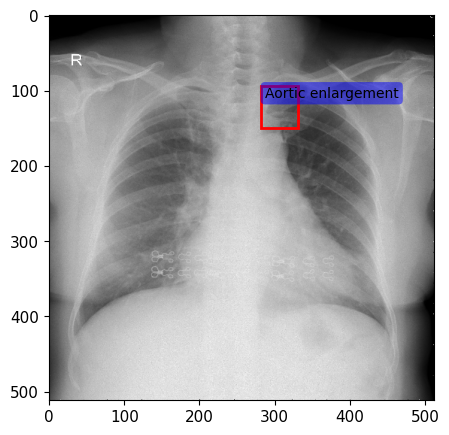

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches

fig, ax = plt.subplots(figsize=(5,5 ))
ax.imshow(image, cmap = 'gray')


# Create a NEW rectangle each time
rect = patches.Rectangle((x_min_scaled, y_min_scaled), bbox_width, bbox_height, linewidth=2, edgecolor='r', facecolor='none')

# Add the new rectangle to the axes
ax.add_patch(rect)
ax.text(
    x_min_scaled + 5, y_min_scaled + 15,  # Offset text a bit inside the bbox
    class_name, fontsize=10,
    bbox=dict(facecolor="blue", alpha=0.5, edgecolor="none", boxstyle="round,pad=0.3")
)
plt.show()

PREDICTED BBOX

/root/.cache/torch/hub/ultralytics_yolov5_master/models/common.py:894: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with amp.autocast(autocast):


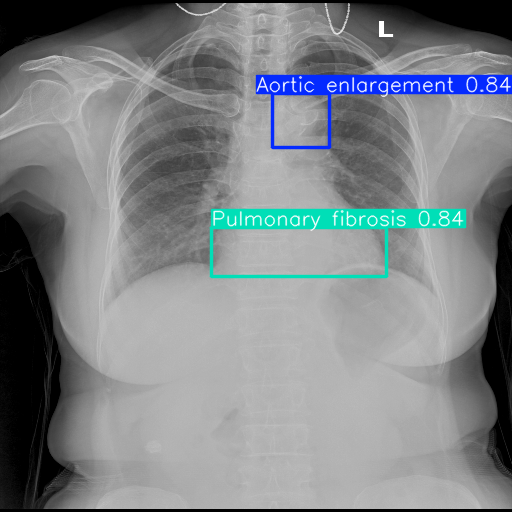

In [ ]:
result = model(pathy)
result.show()